# Tuning device
Eduardo José González Coll, Marta Felix Cubero, Maria Cristina Romera Medialdea
### 
**Description**: We are going to implement an algorithm that finds whether a 6-strings guitar and a piano are tuned or not. For that we will make use of the physical device: Rasberry Pi


In [6]:
import wave, time, math
import numpy as np
import IPython.display as ipd
import matplotlib.pyplot as plt
from decimal import *
from scipy.io import wavfile
from scipy import signal
from IPython.display import Audio
import numpy as np
import sys
from pyaudio import PyAudio, paInt16
import sounddevice
from scipy.io.wavfile import write
import detect_peaks as dp
import pandas as pd
from IPython.display import display, Image
import cv2
import matplotlib.image as mpimg

## **INTRODUCTION**

Tuning is the process of adapting the pitch of one tone from a musical instrument to meet standardised intervals. Tuning is usually based on a fixed reference, which typically is 440 Hz. 

There exist different methods to tune different instruments. Once one tone is known in the guitar, it can be adjusted by ear tuning. This is because a comparison can be made between the string that is known to be tuned and the following string, both producing the same pitch. 
The constraint with this technique is the accuracy level. The human hearing system can have different thresholds, which cannot sufficiently tune a guitar correctly. It has been proven that people with musical training backgrounds can perceive tones with better accuracy. Anyhow, it is reasonable that for most people without the expertise or capacity to "tune by ear", a physical device helps them through this challenge. 


In order to tune it, it ought to know "where" to tune it. Pitch is conceived physically as frequency, measured in Hertz. Notes (A,A#,B,...) belong to a fixed tuning scale system. For the scope of this project is very important to define the different musical scales.  



#### **THEORY**

In Western music, the standard tonal scale is the 12-tone chromatic scale. It is defined within a range of one octave and divided into twelve equally distanced tones, called equal temperament (ET). The step from one tone to the next closest is considered "half a tone". Half-tone intervals in the ET have a 100 cents difference. 

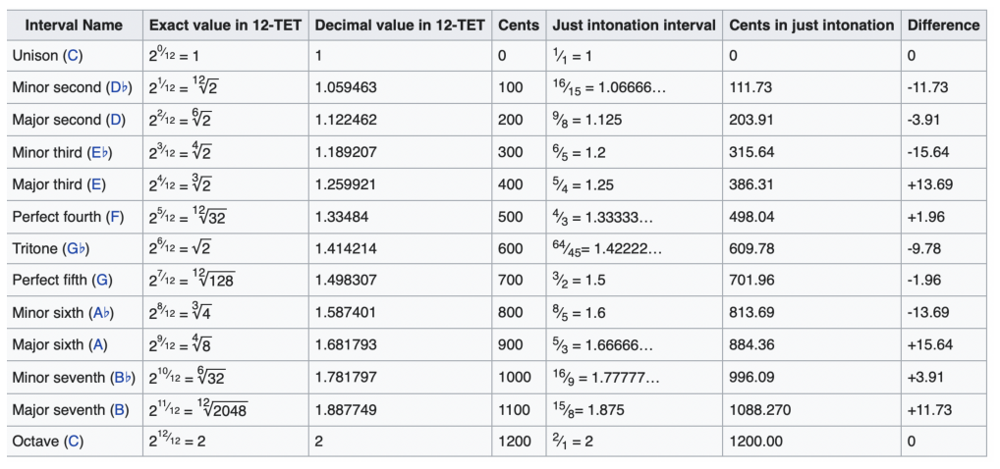

In [11]:
plt.figure(figsize=(18,15))
plt.axis('off')
img = mpimg.imread('table.png')
plt.imshow(img)
plt.show()

It is known that the reason for equal temperament was adopted in order to preserve the distance between semitones. Before, it was used just intonation, which maintains whole number ratios (such as 3:2 or 4:3), with the drawback of being only precise for one key at a time. This means that an instrument could be purely tuned for a key. Key modulations would lead to a noticeable failure of intonation.

This is why guitars and pianos are tuned in ET.

The six strings of a guitar have the following tones: E2 A2 D3 G3 B3 E4. The number behind the key gives information about which octave is in. For example, E2 = 82.41 (Hz) while E4 = 329.63 (Hz).

In order to compute the frequencies in the ET scale, the needed formula is:  


\begin{equation}
  f[Hz]=27,5* 2^{i/12}
\end{equation}

Where "27,5[Hz]" is the first key in the piano, and "i" is the number of keys in the piano. When i=0, the key is A0, the lowest pitch in the piano.


### **Recordings**

It was planned to use a microphone built into a Raspberry Pi for the measurements.  In order to hear it properly, the microphone was place just a few centimeters away from the guitar, while the computer was stading 1 meter away. 

The difference between both of them can be heard here: 


In [1]:
from IPython.display import Video

Video("/Users/eduardogonzalezcoll/Documents/TELECO/EPFL/Computers & Music/Presentation/tuning_guitar.mp4",embed=True)

This is the sound of the guitar recorded with the a MacBook Air in-built microphone: 

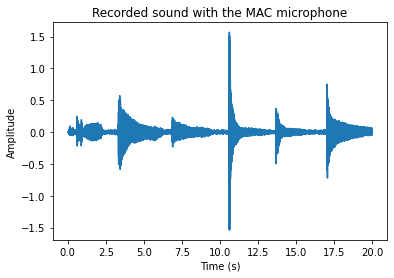

In [3]:
audio_sample_sf, song_mac = wavfile.read('test_guitarra_mac.wav')
song_mac=song_mac-np.mean(song_mac)
t=np.arange(0,len(song_mac))/audio_sample_sf

plt.figure()
plt.plot(t,song_mac)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
plt.title('Recorded sound with the MAC microphone')

Audio(song_mac, rate=audio_sample_sf)



And this is the sound of the guitar recored with the microphone builted in the Raspberry Pi. 

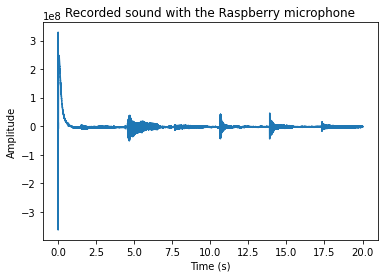

In [4]:
audio_sample_sf, song_rasp = wavfile.read('guitar.wav')
song_rasp=song_rasp-np.mean(song_rasp)
t=np.arange(0,len(song_rasp))/audio_sample_sf

plt.figure()
plt.plot(t,song_rasp)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
plt.title('Recorded sound with the Raspberry microphone')

Audio(song_rasp, rate=audio_sample_sf)



As we see in the previous plot, at the begining of the recording there is an undesired noise shock. We trim the audio signal. And then we compare with the one recorded with the mac- microphone

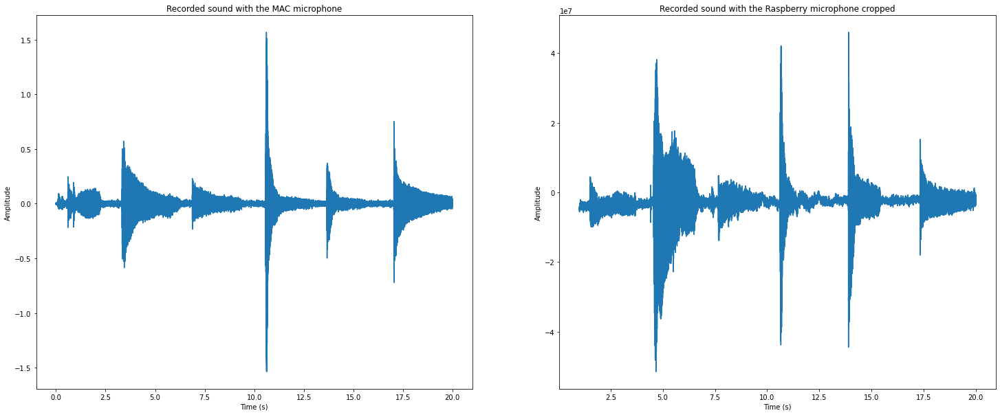

In [6]:
#Crop the noise shock

t1_crop=t[audio_sample_sf:len(t)*audio_sample_sf]
song1_trim=song_rasp[audio_sample_sf:len(song_rasp)*audio_sample_sf]


plt.subplots(1,2,figsize=(25,10))
plt.subplot(1,2,1)
plt.plot(t,song_mac)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
plt.title('Recorded sound with the MAC microphone')
plt.subplot(1,2,2)
plt.plot(t1_crop,song1_trim)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
plt.title('Recorded sound with the Raspberry microphone cropped')
plt.show()

Audio(song1_trim, rate=audio_sample_sf)



As we have checked, during the test measurements, it has been noted that the amplitude values of the recorded audio with the raspberry pi are higher than those with the mac microphone. It is remarkable to say that the microphone of the raspberry pi was 5 cm away from the guitar. As seen in the video below. It can be concluded that in order to be heard properly with a good quality level signal, the Raspberry Pi microphone would have to be installed inside the guitar, as some electro-acoustic guitars do. 


When using the algorithm on the computer with the piano, we recorded note by note all at once, but the user at every moment could check what note had to be played, and which note was the following. 

Regarding the piano, we must take into consideration that to record with the raspberry pi microphone we have to specify how many seconds we wanted to record, and as we don't have a screen conected, in any case we could check the note played. This is one of the reason why for the piano we use the mac microphone. 
In order to measure other acoustic instruments like a piano, the computer's microphone works better. 

(4second/note)x88note=>5.87 minutes. This is the duration of the recorded audio for the piano

## Ground Truth 

For the measurements, it was needed a groundtruth of the frequency to test the program. For this endeavour, the mobile phone app ***Just Intonation*** was used. This app provides accuracy for pure tones of frequency.




# **Measurements**

The library sounddevice was used because it provides bindings for the PortAudio library and a few convenience functions to play and record NumPy arrays containing audio signals. 

In the first attempt, the goal is to record a sound of certain length in seconds, and save the audio file as a '.wav' format. 
The variable *fs* represents the sample frequency rate. In this case, it was choosen a standard one, with a value of 44,100[samples/s].
The *record_voice* has the length of the signal as the first input. Since the length of the signal is measured in samples because of its discrete nature, the formula seconds per sample frequency is described as: 

\begin{equation}
        duration*f_s = [second] * \frac{[samples]}{[second]} = [samples]
\end{equation}

The code below is meant for recording one single file. In this project, there is going to be three case studies: 
* Case 1: One single tone 
* Case 2: Two tones with 100 cents difference 
* Case 3: Two tones with 700 cents difference 


In [17]:
#RECORD FILE
sounddevice.default.reset()
second=3
fs=44100
record_voice = sounddevice.rec( int( second * fs ) , samplerate = fs , channels = 1 )
#record voice for 3 seconds
sounddevice.wait()
#stop recording
write('name_of_file', fs, record_voice)

Once the file has been recorded and saved, the next step is to read the file and save it. 
In this case, there is a redundancy, since it is already known the sample frequency the recording has been done. Nevertheless, in order to avoid any errors, the frequency is again computed as fs.

In [48]:
def plot_spectrum(x, sf, fmax=None, dB=False, lw=2):
    if fmax is None or fmax > sf / 2:
        fmax = sf / 2
    N = int(len(x) * fmax / sf)
    X = np.abs(np.fft.fft(x)[0:N])
    if dB:
        X = 20 * np.log10(X)
    plt.plot(np.linspace(0, fmax, N), X, linewidth=lw)
    plt.title('Zoom in (FFT)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('|F (f)|')

### Case 1

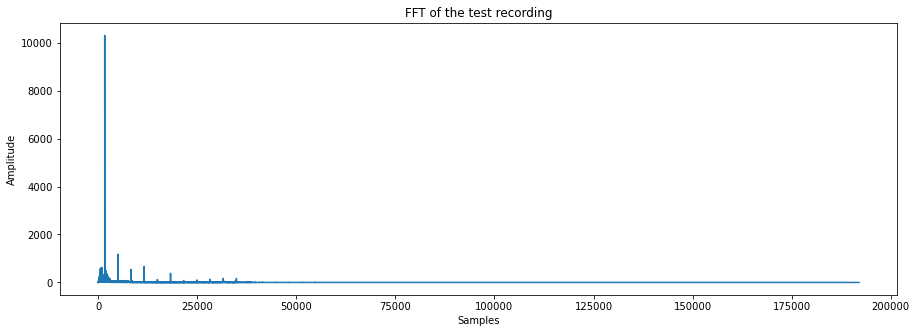

The frequency is located in sample number: 1661
The number of seconds of the signal is: 4.0
The frequency of the signal is: 415.25 [Hz]
The sample frequency of the signal is: 96000 Samples/second


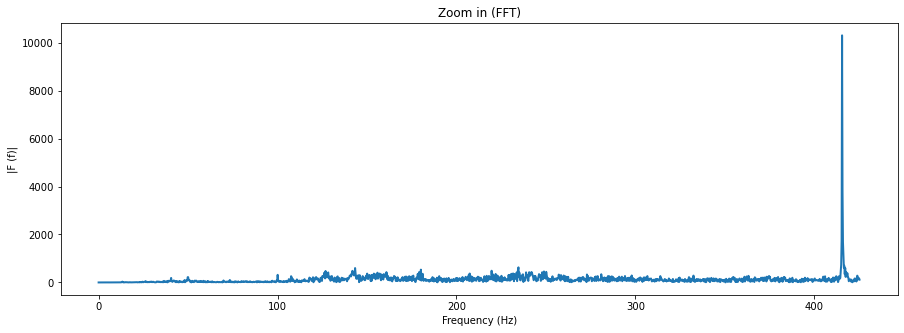

In [49]:
fs, recording = wavfile.read("test.wav")

#The mean is done in order to remove the background sound and have a cleaner result of the signal
recording = (recording - np.mean(recording)) 

#The Fourier Transform is shown in order to see in the frequency domain 
plt.figure(figsize=(15,5))
signal_fft = np.abs(np.fft.fft(recording)[0:int(len(recording)/2)])
plt.plot(signal_fft);
plt.title("FFT of the test recording");
plt.xlabel('Samples')
plt.ylabel('Amplitude')
plt.show()

pos1 = np.argmax(signal_fft) 

#Divide the length of the signal by the sampling frequency to get the time in seconds
seconds = len(recording)/fs

#Frequency is the the sample divided by the seconds.  
freq = pos1 / seconds

plt.figure(figsize=(15,5))
plot_spectrum(recording, fs,fmax=freq+10); 


print("The frequency is located in sample number:",pos1)
print("The number of seconds of the signal is:",seconds)
print("The frequency of the signal is:",freq,"[Hz]")
print("The sample frequency of the signal is:",fs,"Samples/second")



The first part of the project was reached. The algorithm can succesfully recognise the frequency of a signal.

However, there is still a few problems to be addressed. 
* This only works for one frequency at a time. 
* The resolution of the frequencies steps haven't been taken into account.

The next step is to take into consideration two simultaneous tones

### Case 2

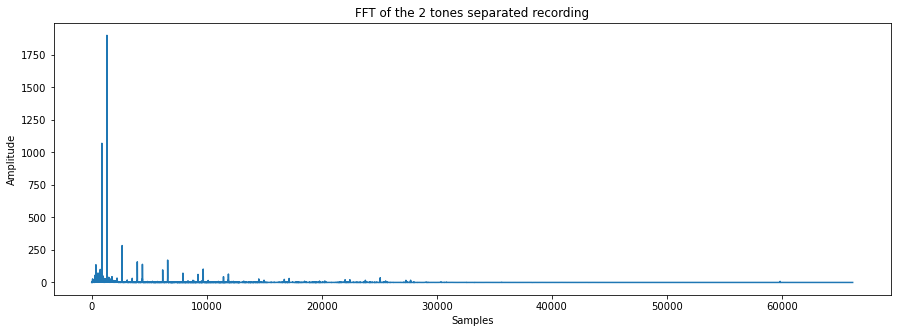

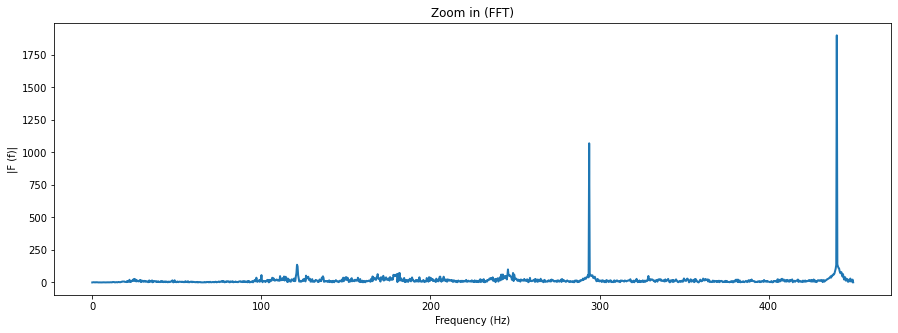

In [51]:
fs, recording = wavfile.read("Two_tones_sep.wav")

#The mean is done in order to remove the background sound and have a cleaner result of the signal
recording = (recording - np.mean(recording)) 

#The Fourier Transform is shown in order to see in the frequency domain 
plt.figure(figsize=(15,5))
signal_fft = np.abs(np.fft.fft(recording)[0:int(len(recording)/2)])
plt.plot(signal_fft);
plt.title("FFT of the 2 tones separated recording");
plt.xlabel('Samples')
plt.ylabel('Amplitude')
plt.show()

pos1 = np.argmax(signal_fft) 

#Divide the length of the signal by the sampling frequency to get the time in seconds
seconds = len(recording)/fs

#Frequency is the the sample divided by the seconds.  
freq = pos1 / seconds

plt.figure(figsize=(15,5))
plot_spectrum(recording, fs,fmax=freq+10); 


### Case 3

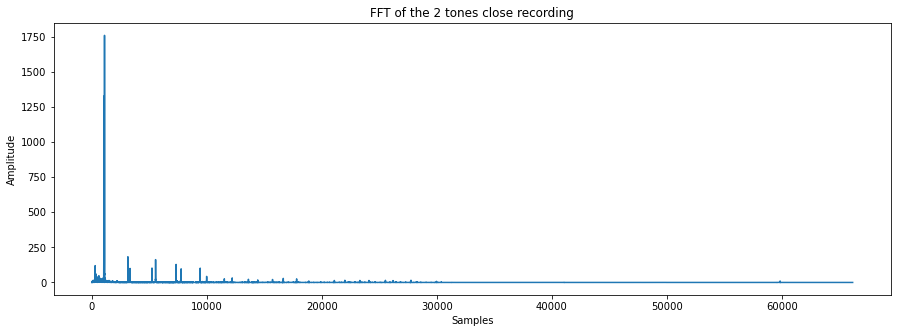

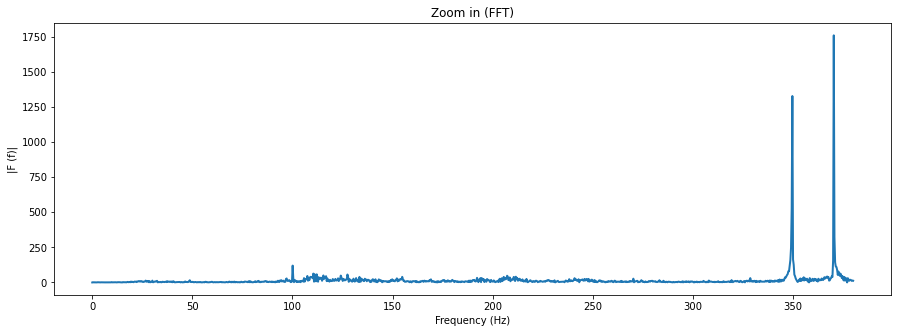

In [52]:
fs, recording = wavfile.read("Two_tones_close.wav")

#The mean is done in order to remove the background sound and have a cleaner result of the signal
recording = (recording - np.mean(recording)) 

#The Fourier Transform is shown in order to see in the frequency domain 
plt.figure(figsize=(15,5))
signal_fft = np.abs(np.fft.fft(recording)[0:int(len(recording)/2)])
plt.plot(signal_fft);
plt.title("FFT of the 2 tones close recording");
plt.xlabel('Samples')
plt.ylabel('Amplitude')
plt.show()


pos1 = np.argmax(signal_fft) 

#Divide the length of the signal by the sampling frequency to get the time in seconds
seconds = len(recording)/fs

#Frequency is the the sample divided by the seconds.  
freq = pos1 / seconds

plt.figure(figsize=(15,5))
plot_spectrum(recording, fs,fmax=freq+10); 

The FFT of a real-valued input signal will produce a conjugate symmetric result. So, for FFT result magnitudes only of real data, the negative frequencies are just mirrored duplicates of the positive frequencies and can thus be ignored when analyzing the result. In the figure above, it is only shown half of the samples recorded.

When doing the fft, it can be seen that even if a pure tone is recorded, its harmonics can be seen. A harmonic is a wave with a frequency that is a positive integer multiple of the fundamental frequency, in this case, the pure tone. Usually, the harmonics will have a lower amplitude than the fundamental frequency. On the other hand,  two tones played simultaneously with the same harmonics may produce higher amplitude harmonics that could be confused as a fundamental note. For this reason, we measured the difference when two tones are played simultaneously. First, two consecutive tones are separated by half a tone, or 100 cents. This is saved in the audio file *'Two_peaks_close.wav'* The other two tones were separated by 700 cents or an interval of a fifth, which can be listen in the file *'Two_peaks_sep.wav'* This should produce higher harmonics. This test helped prove how the algorithm works with two tones, especially when they are very close. 

One thing that can be noticed is that some of the values of the samples are close. They represent the same peak, but the peak is distributed in different bins. This problem will be addressed later. lose. 

The next goal was to identify the tones of a piano. The main concern was whether the timbre, thus, the resonance frequencies, would affect the detection of the tone and if there would be a quantitative difference. 

In order to measure it, different pianos on campus were tested. The first piano was in the SV building. The recording was done key by key. Each key was pressed for 2 seconds until the 88 keys of the piano were stored in a vector. 


First, the name of the notes is stored in a vector. Then, a list with all the piano frequencies in the equal temperament scale is computed and stored. This is done in the function *create_freq_list*.
The function *search_freq* searches for the closest frequency compared with the recorded one. This outputs the name of the closest note, its frequency, and the error it is committed.  

In [33]:
NOTE_NAMES = 'A0 A0# B0 C1 C1# D1 D1# E1 F1 F1# G1 G1# A1 A1# B1 C2 C2# D2 D2# E2 F2 F2# G2 \
G2# A2 A2# B2 C3 C3# D3 D3# E3 F3 F3# G3 G3# A3 A3# B3 C4 C4# D4 D4# E4 F4 F4# G4 G4# A4 A4# B4 \
C5 C5# D5 D5# E5 F5 F5# G5 G5# A5 A5# B5 C6 C6# D6 D6# E6 F6 F6# G6 G6# A6 A6# B6 C7 C7# D7 D7# \
E7 F7 F7# G7 G7# A7 A7# B7 C8'.split()


def create_freq_list():
    freq_list = []
    for i in range(0,88):
        freq_list.append(27.5*2**(i/12))
    return  freq_list

def search_freq(freq, freq_list, NOTE_NAMES):
    diff = []
    for i in range(0,88):
        diff.append(abs(freq-freq_list[i]))

    position = diff.index(min(diff))
    #position = np.argmin(diff)
    return freq_list[position], NOTE_NAMES[position], diff[position]

In [34]:
freq_list=create_freq_list()

f, note, error = search_freq(freq,freq_list, NOTE_NAMES)
print("Note that the algorithm recognises:",note)
print("Frequency of the note:",f)
print("Error:",error)

Note that the algorithm recognises: A4
Frequency of the note: 440.0
Error: 0.0


The following code addresses the problem of the proximity of peaks. As described before, one peak can sometimes be in multiple bins simultaneously. This would detect as the second note the same note, which is not valid. 
There are multiple solutions to this problem. The approach in this project is to look for the number position of the note in the list of all notes. Once we know the position, we search for its frequency. 


Once the maximum frequency is known, the difference in frequency between this note and the previous one is computed. The goal is to add a threshold of samples so that a minimum separation between samples is required. 

Then, the peaks of the algorithms are searched with a function called *detect_peaks*. This function can be input with a minimum distance measured in samples. This will return a vector of peaks. 

Once the vector of peaks is known, we will measure them hierarchically of their amplitude. 


The number position of the note in the list of notes is: 48
24.695302420054873 [Hz]-->difference_max_freq
37.0 samples of difference


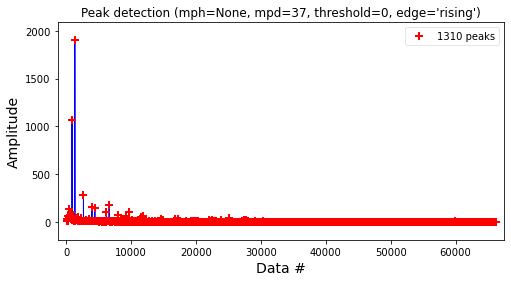

[   36    75   146 ... 66059 66099 66147] idx
[3.37077766e+00 2.73119306e+01 1.67583565e+01 ... 2.87310883e-03
 2.87327620e-03 2.87302863e-03] amplitude
[1899.65532901 1069.6429989 ] first two amplitudes
[16 25] i
[ 881 1320] idx for our two maximums in signal_fft


In [35]:
#when we know the note, we want the number position of the note in the list
position = NOTE_NAMES.index(note)
print("The number position of the note in the list of notes is:",position)

#we search the note in the freq_list
freq_first_max = freq_list[position]

previous_to_max_freq = freq_list[position-1]
difference_max_freq = freq_first_max - previous_to_max_freq
print(difference_max_freq,"[Hz]-->difference_max_freq")

samples_of_difference =np.floor(difference_max_freq*(seconds/2))
print(samples_of_difference,'samples of difference')

#minimun_distance=27.5*2**(position/12)-27.5*2**((position-1)/12)
minimun_distance = samples_of_difference
idx = dp.detect_peaks(signal_fft,mpd=int((minimun_distance)),show=True) #is a vector with the indexes of the peaks 
print(idx,'idx')

#we want the amplitude of the indexes
amplitude = signal_fft[idx]
print(amplitude,'amplitude')

#--------------------------------------------------
#THIS IS JUST FOR OUR INFORMATION AND TO VERIFY THAT THE ALGORITHM WORKS
#we want the amplitude ordered from max to min 
amplitude_ordered = np.sort(amplitude)[::-1]
#save the two first values of the ordered amplitude 
first_two_amplitudes = amplitude_ordered[0:2] 
print(first_two_amplitudes,'first two amplitudes')
#--------------------------------------------------
#i is the vector amplitude ordered from max to min
i = np.argsort(amplitude)[-2:]
print(i,'i')
idx_2max = idx[i]
print(idx_2max,'idx for our two maximums in signal_fft')

Here they are the results of the analysis of the two tones:

In [55]:
freq_of_maximum = idx_2max * (fs/len(recording))
print('The two tones are: ',freq_of_maximum[0], 'Hz ',freq_of_maximum[1], 'Hz')

The two tones are:  293.66666666666663 Hz  440.0 Hz


# Measuring the piano 
Measuring the piano can be an exhausting task. It can take between 3 and 6 minutes, and it cannot be any problems when measuring. After a while, one can be confused about which note is the algorithm currently measuring. To avoid this problem, the algorithm must show the user which note is currently being recorded.

In [2]:
from IPython.display import Video

Video("/Users/eduardogonzalezcoll/Documents/TELECO/EPFL/Computers & Music/Presentation/tuning_piano.mp4",embed=True)

In [ ]:
def create_piano_list():
    piano_freq_list = [] 
    for i in range(0,88):
        
            time.sleep(1)
            sounddevice.default.reset()
            print('recording starts now for ', NOTE_NAMES[i])
            second=4
            fs=44100
            record_voice = sounddevice.rec( int( second * fs ) , samplerate = fs , channels = 1 )
            #record voice for 3 seconds
            sounddevice.wait()
            #stop recording
            write('test.wav', fs, record_voice)
            print('recording ends')

            fs, recording = wavfile.read("name_of_file.wav")
            recording = (recording - np.mean(recording)) 

            signal_fft = np.abs(np.fft.fft(recording)[0:int(len(recording)/2)])

            pos = np.argmax(signal_fft)  

            #we divide the length of the signal by the sampling frequency to get the time in seconds
            seconds = len(recording)/fs
            piano_freq_list.append(pos / seconds) 
    return piano_freq_list

In the next two lines of code it is executed the measurement of the piano and stored in a '.txt'.

In [ ]:
piano_freq_list = create_piano_list()
np.savetxt('name_of_file.txt', piano_freq_list, fmt='%f')

After the measurement, the data is opened and processed in csv.

In [ ]:
f = open("name_of_file.txt", "r")
f_list = f.read().split()
# convert list of strings from txt file to list of floats
frequencies = [float(x) for x in f_list]

freq_list =create_freq_list()

processed = []
print(frequencies)
for i in range(len(frequencies)):

    f, nota, error = search_freq(frequencies[i],freq_list, NOTE_NAMES)
    processed.append([str(frequencies[i]),str(f),str(note),str(error)])


processed = np.array(processed)
print(processed)


#we want to save the processed data in a csv file with a header
np.savetxt('name_of_file.csv', processed, fmt='%s', delimiter=';', header='Recording;Frequency in list;Note in list;Error')


# Comparison between pianos

Execute to see the colors in the tables.

In [18]:
df_piano_bc=pd.read_csv("piano_BC_processed.csv",header=None,sep=";")
df_piano_sv=pd.read_csv("piano_SV_processed.csv",header=None,sep=";")
df_piano_arq=pd.read_csv("piano_PIANO_processed.csv",header=None,sep=";")

#rename columns as the name in the elements in the first rows
df_piano_bc.columns=df_piano_bc.iloc[0]
df_piano_sv.columns=df_piano_sv.iloc[0]
df_piano_arq.columns=df_piano_arq.iloc[0]

#Delete the first row and reset the index
df_piano_bc=df_piano_bc.iloc[1:].reset_index(drop=True)
df_piano_sv=df_piano_sv.iloc[1:].reset_index(drop=True)
df_piano_arq=df_piano_arq.iloc[1:].reset_index(drop=True)

#Rename column '# Recording' to 'Recording'
df_piano_bc.rename(columns={'# Recording':'Recording'},inplace=True)
df_piano_sv.rename(columns={'# Recording':'Recording'},inplace=True)
df_piano_arq.rename(columns={'# Recording':'Recording'},inplace=True)

#Create a new column name 'note_name' with NOTE_NAMES    
df_piano_bc['Note name']=NOTE_NAMES
df_piano_sv['Note name']=NOTE_NAMES
df_piano_arq['Note name']=NOTE_NAMES

df_piano_bc['Freq theorical']=freq_list
df_piano_sv['Freq theorical']=freq_list
df_piano_arq['Freq theorical']=freq_list

df_piano_bc['Recording']=df_piano_bc['Recording'].astype(float)
df_piano_sv['Recording']=df_piano_sv['Recording'].astype(float)
df_piano_arq['Recording']=df_piano_arq['Recording'].astype(float)

df_piano_bc



,Recording,Frequency in list,Note in list,Error,Note name,Freq theorical
0,425.0,415.3046975799451,G4#,9.695302420054873,A0,27.500000
1,194.5,195.99771799087466,G3,1.497717990874662,A0#,29.135235
2,177.5,174.61411571650194,F3,2.885884283498058,B0,30.867706
3,187.0,184.9972113558172,F3#,2.0027886441828002,C1,32.703196
4,199.5,195.99771799087466,G3,3.502282009125338,C1#,34.647829
...,...,...,...,...,...,...
83,3353.5,3322.4375806395615,G7#,31.062419360438525,G7#,3322.437581
84,189.0,184.9972113558172,F3#,4.0027886441828,A7,3520.000000
85,188.0,184.9972113558172,F3#,3.0027886441828002,A7#,3729.310092
86,4001.0,3951.066410048994,B7,49.93358995100607,B7,3951.066410


In [19]:
df_piano_bc=df_piano_bc.drop(columns=['Frequency in list','Note in list'])
df_piano_sv=df_piano_sv.drop(columns=['Frequency in list','Note in list'])
df_piano_arq=df_piano_arq.drop(columns=['Frequency in list','Note in list'])

In [20]:
#Compute difference between the recording and the theoretical frequency
df_piano_bc['Dif freq']=df_piano_bc['Recording']-df_piano_bc['Freq theorical']
df_piano_sv['Dif freq']=df_piano_sv['Recording']-df_piano_sv['Freq theorical']
df_piano_arq['Dif freq']=df_piano_arq['Recording']-df_piano_arq['Freq theorical']

#Create new column 'Threshold' 
df_piano_bc['Cents']=1200*np.log2(df_piano_bc['Freq theorical']/df_piano_bc['Recording'])
df_piano_sv['Cents']=1200*np.log2(df_piano_sv['Freq theorical']/df_piano_sv['Recording'])
df_piano_arq['Cents']=1200*np.log2(df_piano_arq['Freq theorical']/df_piano_arq['Recording'])

#If 50 is > 'cents' then it is a mistake
df_piano_bc['Tuned']=np.abs(df_piano_bc['Cents'])<50
df_piano_sv['Tuned']=np.abs(df_piano_sv['Cents'])<50
df_piano_arq['Tuned']=np.abs(df_piano_arq['Cents'])<50



In [21]:
def color_boolean(val):
    color =''
    if val == True:
        color = 'green'
    elif val == False:
        color = 'red'
    return 'background-color: %s' % color

#Count how many true values we have in column 'Tuned'
N_bc_tuned=df_piano_bc['Tuned'].value_counts()
N_sv_tuned=df_piano_sv['Tuned'].value_counts()
N_arq_tuned=df_piano_arq['Tuned'].value_counts()



Number of tuned notes in BC: 50
Number of tuned notes in SV: 37
Number of tuned notes in ARQ: 44


In [22]:
df_piano_bc.style.applymap(color_boolean, subset=['Tuned'])

0,Recording,Error,Note name,Freq theorical,Dif freq,Cents,Tuned
0,425.000000,9.695302420054873,A0,27.500000,397.500000,-4739.951181,False
1,194.500000,1.497717990874662,A0#,29.135235,165.364765,-3286.719958,False
2,177.500000,2.885884283498058,B0,30.867706,146.632294,-3028.378601,False
3,187.000000,2.0027886441828002,C1,32.703196,154.296804,-3018.641696,False
4,199.500000,3.502282009125338,C1#,34.647829,164.852171,-3030.662267,False
5,138.500000,0.0913154884360381,D1,36.708096,101.791904,-2298.858943,False
6,187.000000,2.0027886441828002,D1#,38.890873,148.109127,-2718.641696,False
7,197.000000,1.002282009125338,E1,41.203445,155.796555,-2708.830527,False
8,205.500000,2.1523487899725637,F1,43.653529,161.846471,-2681.961844,False
9,178.500000,3.885884283498058,F1#,46.249303,132.250697,-2338.104661,False


In [23]:
df_piano_sv.style.applymap(color_boolean, subset=['Tuned'])

0,Recording,Error,Note name,Freq theorical,Dif freq,Cents,Tuned
0,100.000000,2.001141004562683,A0,27.500000,72.500000,-2234.995772,False
1,390.000000,1.9954359817493241,A0#,29.135235,360.864765,-4491.164720,False
2,398.500000,6.504564018250676,B0,30.867706,367.632294,-4428.491441,False
3,383.000000,8.995435981749324,C1,32.703196,350.296804,-4259.809042,False
4,411.000000,4.3046975799451275,C1#,34.647829,376.352171,-4281.961844,False
5,141.500000,2.908684511563962,D1,36.708096,104.791904,-2335.958235,False
6,151.000000,4.167616041296242,D1#,38.890873,112.109127,-2348.454031,False
7,162.000000,2.8137784564349886,E1,41.203445,120.796555,-2370.188347,False
8,171.500000,3.114115716501942,F1,43.653529,127.846471,-2368.846063,False
9,91.000000,1.4986056779085999,F1#,46.249303,44.750697,-1171.721912,False


In [24]:
df_piano_arq.style.applymap(color_boolean, subset=['Tuned'])

0,Recording,Error,Note name,Freq theorical,Dif freq,Cents,Tuned
0,367.750000,2.2444227116343995,A0,27.500000,340.250000,-4489.466181,False
1,464.750000,1.4137615180898138,A0#,29.135235,435.614765,-4794.741610,False
2,453.000000,13.0,B0,30.867706,422.132294,-4650.409032,False
3,230.250000,2.8318807590449637,C1,32.703196,197.546804,-3378.837159,False
4,137.500000,1.091315488436038,C1#,34.647829,102.852171,-2386.313714,False
5,220.000000,0.0,D1,36.708096,183.291904,-3100.000000,False
6,234.250000,1.1681192409550363,D1#,38.890873,195.359127,-3108.654629,False
7,248.500000,1.558349371937993,E1,41.203445,207.296555,-3110.890794,False
8,217.250000,2.75,F1,43.653529,173.596471,-2778.223184,False
9,229.500000,3.5818807590449637,F1#,46.249303,183.250697,-2773.188756,False


# Results
After carrying out the measurements on the three pianos, we have obtained the following results: number of tuned notes in building BC: 50, number of tuned notes in SV building: 37, number of tuned notes in Architecture's building: 44. The frequencies obtained via our algorithm for the first two buildings have a *freq_step* of 0.5 Hz, whereas the  *freq_step* is 0.25 Hz for the architecture's building.

The degree of de-tuning of each note can be observed in the column "dif_freq" to compute the difference between the recorded note and the theoretical frequency associated with the played note.

In the column 'tuned', we have highlighted in green those notes that our algorithm has classified as tuned notes. To do so, we have assumed that a tuned note is the one where the calculated cent is lower than 50, where 50 is one-quarter of a tone. This decision was made because a study (BURNS, Edward M.; CAMPBELL, Shari L., 1994) found that the maximum resolution of people with absolute pitch is of intervals separated by 30 cents with an accuracy of 70% correct. 

\begin{equation}
        cents = 1200 * \log_{2} \frac{f_2}{f_1} \ 
\end{equation}

Where f2 is the theoretical frequency and f1 is the frequenncy obtained with the alogorithm. 

# Limitations
In our work, the only way to improve the frequency resolution is based on increasing the duration of the recording.  There is a compromise between speed and accuracy. 
This is model by the formula: 
\begin{equation}
    \frac{F_s[Hz]}{\text{lenght(samples in fft)}[Hz*t]}=\text{freq step resolution} [1/t]
\end{equation}


Frequency step resolution is the difference in hertz between one sample and the other sample in the signal's frequency domain. As the formula shows, the only way to increment the freq step resolution is to increase the time of the measure. In this formula, the time is computed in seconds. For this reason, this frequency steps resolution was used during the project:
* 2 second = 0.5 Hz 
* 4 second = 0.25 Hz 

The tuning algorithm requires post-processing of the captured signal.
This takes us away from the ideal tuner as one second could tell us how far away or close you are to the note.



As seen in the 3 tables, the lowest and highest frequencies are not detected correctly. The lowest frequencies detected for the pianos are: BC A2 (midi 24), SV A2# (midi 25), Arquitecture G2 (midi 22). The highhest frequencies detected for the pianos are:  BC B7 (midi 86), SV D7 (midi 77),Arquitecture A7 (midi 84). This can be due to several reasons such as: the sound perception of the microphones used is limited (between 70Hz and 15kHz); and for the high frequencies, the sound of the strike when the note is struck outweights the sound of the strings vibrating.


# Appendix 

The steps for setting up the rasperry pi:
* **1)** Flash the SD card, both the computer and RPI must be connected to the same wifi (using a hotspot network is easier than conncecting to the EPFL's wifi)
* **2)** Power up the RPi and isntall the softawre for the I2S microphone
* **3)** When connecting the components of the microphone the RPi should be disconnected
* **4)** Test the microphone

MEMS mics can detect sound and convert it to voltage, but they are way smaller and thinner. This microphone doesn't even have analog out, its purely digital. The I2S is a small, low cost MEMS mic with a range of about 50Hz - 15KHz, good for just about all general audio recording/detection.
It's a 1.6-3.6V max device only, so not for use with 5V logic . 

The configuration of the mono microphone is the following: 
* Mic 3V to Pi 3.3V
* Mic GND to Pi GND
* Mic SEL to Pi GND (this is used for channel selection, connect to either 3.3V or GND)
* Mic BCLK to BCM 18 (pin 12)
* Mic DOUT to BCM 20 (pin 38)
* Mic LRCL to BCM 19 (pin 35)


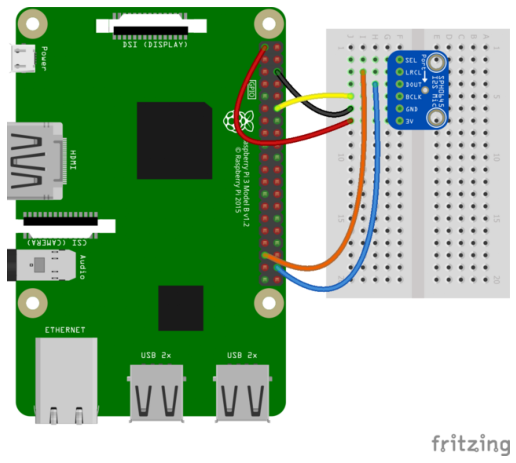

In [57]:
plt.figure(figsize=(9,9))
plt.axis('off')
img = mpimg.imread('sensors_pi_i2s_bb.png')
plt.imshow(img)
plt.show()



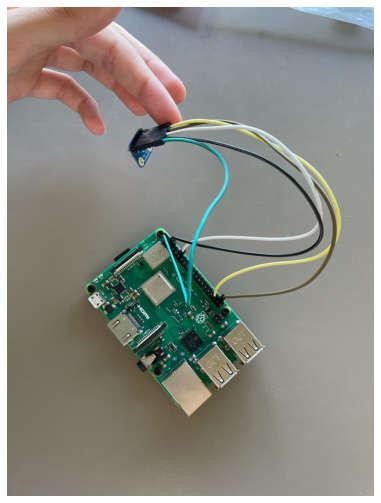

In [8]:
plt.figure(figsize=(12,9))
plt.axis('off')
img = mpimg.imread('rasp.jpeg')
plt.imshow(img)
plt.show()



Photographs measuring the tuning of the piano in PIANO restaurant: 

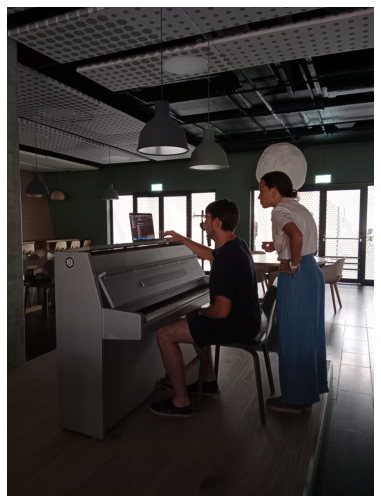

In [53]:
plt.figure(figsize=(12,9))
plt.axis('off')
img = mpimg.imread('piano_room.jpeg')
plt.imshow(img)
plt.show()

